In [24]:
# Import all necessary classes
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader, random_split
from PIL import Image
import os
import random
import numpy as np
from sklearn.metrics import confusion_matrix
from upsetplot import from_contents, plot 
import pandas as pd
import matplotlib.pyplot as plt 
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

%load_ext autoreload
%autoreload 2
# Important local code (using autoreload to pick up local changes)
from mammogram_dataset import MammogramDataset
from utils import extract_images_by_abnormality_id, train_model, evaluate_model, show_confusion_matrix, print_single_view_results_table, compare_performance_all_views
from single_view_mammogram import SingleViewMammogram
from single_view_cnn import SingleViewCNN
from late_fusion_fc import LateFusionFC
from multi_view import MultiViewDataset
from resnet_feature_extractor import ResNetFeatureExtractor
from classifier_head import ClassifierHead
from noise_dataset import RandomNoiseDataset

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
# Configuration and Hyperparameters ---
CONFIG = {
    'num_classes': 2,  # Number of output classes for the dataset
    'num_views': 2,     # Number of views per sample (e.g., front, side)
    'batch_size': 32,
    'learning_rate': 0.001,
    'num_epochs':  20,
    'mv_num_epochs':  30,
    'device': torch.device("cuda" if torch.cuda.is_available() else "cpu"),
    "patience": 10, # Used for early stopping
}

/config/workspace/final/multi_view_fusion/mammogram_research
Training dataset: In collect_files
dirpath : ./data/CBIS-DDSM TCIA/manifest-ZkhPvrLo5216730872708713142/CBIS-DDSM/Mass-Training_P_00920_RIGHT_MLO_1/07-21-2016-DDSM-NA-79837/1.000000-ROI mask images-44633
parent_path_contents  : [PosixPath('data/CBIS-DDSM TCIA/manifest-ZkhPvrLo5216730872708713142/CBIS-DDSM/Mass-Training_P_00920_RIGHT_MLO_1/07-21-2016-DDSM-NA-79837/1.000000-ROI mask images-44633/../../07-21-2016-DDSM-NA-79837'), PosixPath('data/CBIS-DDSM TCIA/manifest-ZkhPvrLo5216730872708713142/CBIS-DDSM/Mass-Training_P_00920_RIGHT_MLO_1/07-21-2016-DDSM-NA-79837/1.000000-ROI mask images-44633/../../07-21-2016-DDSM-NA-79837/1.000000-ROI mask images-44633'), PosixPath('data/CBIS-DDSM TCIA/manifest-ZkhPvrLo5216730872708713142/CBIS-DDSM/Mass-Training_P_00920_RIGHT_MLO_1/07-21-2016-DDSM-NA-79837/1.000000-ROI mask images-44633/../../07-21-2016-DDSM-NA-79837/1.000000-ROI mask images-44633/1-2.dcm'), PosixPath('data/CBIS-DDSM TCIA/man

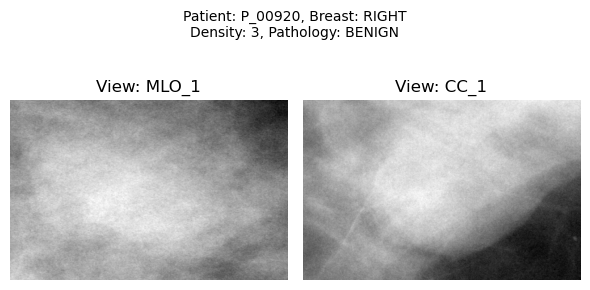

--- Mammogram ROI views Entity 2 ---
  Patient ID: P_01149  Breast Side: RIGHT  Abnormality ID:    1  Breast Density: 2 Pathology: MALIGNANT
View: CC_1:   Image Array Shape: (479, 312)
View: MLO_1:   Image Array Shape: (400, 403)


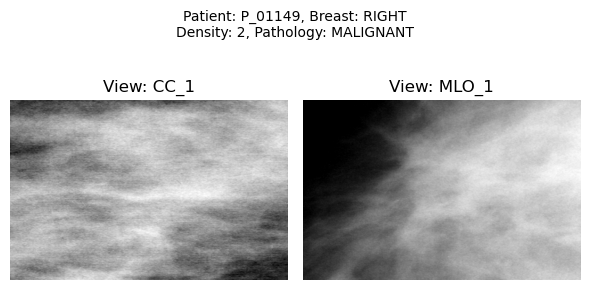

For the training data, there are 273 BENIGN and 263 MALIGNANT pathologies.


In [ ]:
# Initialize the dataset with the path to the CBIS-DDSM directory
# and the path to CSV files.
print(os.getcwd())
dataset_root = "./data/CBIS-DDSM TCIA/manifest-ZkhPvrLo5216730872708713142/"
# Use the csv which provides details of the masses 
csv_path_for_train_dataset = './data/CBIS-DDSM TCIA/mass_case_description_train_set.csv'
csv_path_for_test_dataset = './data/CBIS-DDSM TCIA/mass_case_description_test_set.csv'

# Get the data we need from the csv and files 
print("Training dataset: ",end='')
mammogram_calc_train_dataset = MammogramDataset(dataset_root, csv_path=csv_path_for_train_dataset, is_mass=True)
print("Test data dataset: ",end='')
mammogram_calc_test_dataset = MammogramDataset(dataset_root, csv_path=csv_path_for_test_dataset, is_mass=True)

# Display an example of our data
for i in [0,1]:
    roi_data = mammogram_calc_train_dataset[i]
    print(f"--- Mammogram ROI views Entity {i+1} ---")
    print(f"  Patient ID: {roi_data['patient_id']}  Breast Side: {roi_data['breast_side']}  Abnormality ID:    {roi_data['abnormality id']}  Breast Density: {roi_data['breast density']} Pathology: {roi_data['pathology']}")  
    for j, image_info in enumerate(roi_data['images']):
        if image_info['file_path'].endswith("1-1.dcm"):
            print(f"View: {image_info['image_view']}:   Image Array Shape: {image_info['image'].shape}")

    mammogram_calc_train_dataset.display_roi_images(roi_data)

count_benign = 0
for entity in mammogram_calc_train_dataset.roi_entities:
    if "BENIGN" in (entity['pathology']).upper(): 
        count_benign += 1
count_malignant = len(mammogram_calc_train_dataset) - count_benign
print(f"For the training data, there are {count_benign} BENIGN and {count_malignant} MALIGNANT pathologies.")

SingleView for CC images
Created SVMCC
Created SVMCC resnet50
Created SVMMLO

Train DataLoader has 13 batches. Dataset size: 397
Validation DataLoader has 3 batches. Dataset size: 96
Test DataLoader has 5 batches. Dataset size: 150
Frozen all parameters except the final layer.
Modified ResNet50 final layer: Linear(in_features=2048, out_features=2, bias=True)

Starting training with validation and early stopping...
Epoch 1/20
----------
train Loss: 0.7229 Acc: 0.4761
val Loss: 0.6879 Acc: 0.5417
Validation loss improved to 0.6879. Saving model weights.
Epoch 2/20
----------
train Loss: 0.6863 Acc: 0.5239
val Loss: 0.6952 Acc: 0.5000
Validation loss did not improve. Patience: 1/10
Epoch 3/20
----------
train Loss: 0.6489 Acc: 0.6222
val Loss: 0.6718 Acc: 0.5625
Validation loss improved to 0.6718. Saving model weights.
Epoch 4/20
----------
train Loss: 0.6352 Acc: 0.6474
val Loss: 0.6645 Acc: 0.6250
Validation loss improved to 0.6645. Saving model weights.
Epoch 5/20
----------
train Loss

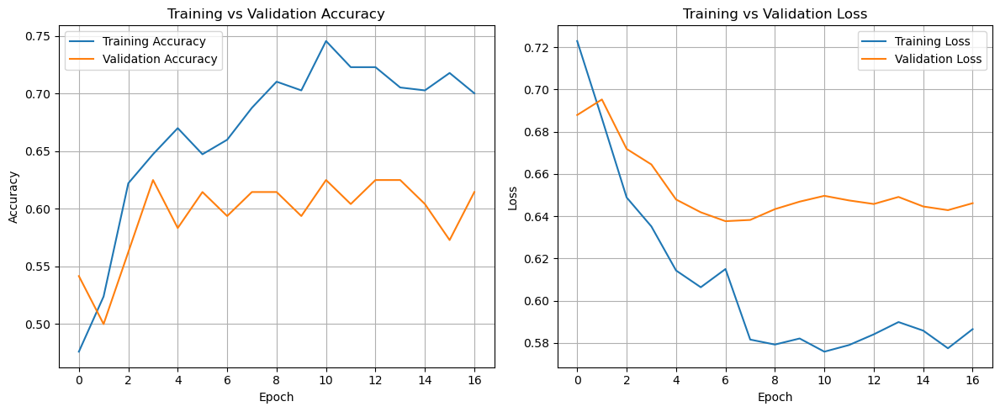


Final evaluation on the test set using the best model (based on validation performance):
Model will be saved to : mass/model_CC_best_val_model.pth
Final Test Loss: 0.7168 Acc: 0.5267


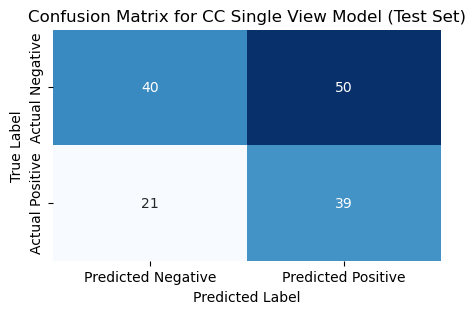

********************


In [ ]:
# Run Single View Analysis
# Create a SingleView for CC images , training the Resnet50 CNN on the training data and then testing with the test set
print("SingleView for CC images")
single_view_cc = SingleViewMammogram(train_dataset=mammogram_calc_train_dataset, 
    test_dataset=mammogram_calc_test_dataset,view_type="CC")
print("Created SVMCC")
single_view_cc.CreateResnet50Dataset()
print("Created SVMCC resnet50")
single_view_cc_cnn = SingleViewCNN(single_view_cc.torch_dataset_train_view,single_view_cc.torch_dataset_validation_view,single_view_cc.torch_dataset_test_view,"CC")
print("Created SVMMLO")
# Define loss function and optimizer
single_view_cc_best_model_test_predictions, single_view_cc_all_test_labels, cc_performance_results = single_view_cc_cnn.Train(
    CONFIG['num_epochs'],CONFIG['patience'],subdirectory="mass")
print("*"*20)



SingleView for MLO images

Train DataLoader has 13 batches. Dataset size: 397
Validation DataLoader has 3 batches. Dataset size: 96
Test DataLoader has 5 batches. Dataset size: 150
Frozen all parameters except the final layer.
Modified ResNet50 final layer: Linear(in_features=2048, out_features=2, bias=True)

Starting training with validation and early stopping...
Epoch 1/20
----------
train Loss: 0.7143 Acc: 0.5088
val Loss: 0.6925 Acc: 0.5625
Validation loss improved to 0.6925. Saving model weights.
Epoch 2/20
----------
train Loss: 0.6769 Acc: 0.5642
val Loss: 0.6643 Acc: 0.5938
Validation loss improved to 0.6643. Saving model weights.
Epoch 3/20
----------
train Loss: 0.6357 Acc: 0.6171
val Loss: 0.6681 Acc: 0.5938
Validation loss did not improve. Patience: 1/10
Epoch 4/20
----------
train Loss: 0.6302 Acc: 0.6373
val Loss: 0.6622 Acc: 0.6042
Validation loss improved to 0.6622. Saving model weights.
Epoch 5/20
----------
train Loss: 0.6176 Acc: 0.6952
val Loss: 0.6571 Acc: 0.5833
V

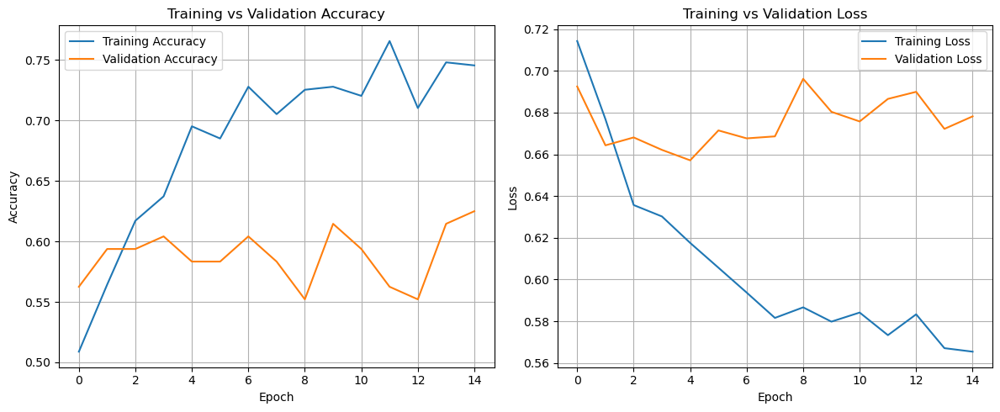


Final evaluation on the test set using the best model (based on validation performance):
Model will be saved to : mass/model_MLO_best_val_model.pth
Final Test Loss: 0.6723 Acc: 0.5867


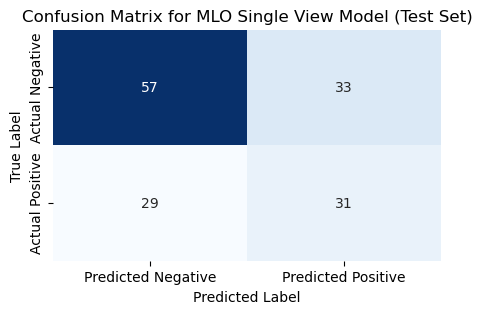

********************


In [38]:
# Create a SingleView for MLO images , training the Resnet50 CNN on the training data and then testing with the test set
print("SingleView for MLO images")
single_view_mlo = SingleViewMammogram(train_dataset=mammogram_calc_train_dataset, 
    test_dataset=mammogram_calc_test_dataset,view_type="MLO")
single_view_mlo.CreateResnet50Dataset()

single_view_mlo_cnn = SingleViewCNN(single_view_mlo.torch_dataset_train_view,single_view_mlo.torch_dataset_validation_view,single_view_mlo.torch_dataset_test_view,"MLO")
# Define loss function and optimizer
single_view_mlo_best_model_test_predictions, single_view_mlo_all_test_labels, mlo_performance_results = single_view_mlo_cnn.Train(
    CONFIG['num_epochs'],CONFIG['patience'],subdirectory="mass")
print("*"*20)

Multi-View Model
Training samples: 397.  Validation samples: 96. Testing samples: 150.
Starting training with validation and early stopping.
Epoch 1/30
----------

Epoch 1/30 - Training Phase
Train Results: Avg Loss: 73.1097, Accuracy: 0.4987

Epoch 1/30 - Validation Phase
Val Results: Avg Loss: 29.3909, Accuracy: 0.5000
Validation loss improved to 29.3909. Saving model weights.
Epoch 2/30
----------

Epoch 2/30 - Training Phase
Train Results: Avg Loss: 28.7154, Accuracy: 0.5743

Epoch 2/30 - Validation Phase
Val Results: Avg Loss: 15.4726, Accuracy: 0.5729
Validation loss improved to 15.4726. Saving model weights.
Epoch 3/30
----------

Epoch 3/30 - Training Phase
Train Results: Avg Loss: 28.7559, Accuracy: 0.5416

Epoch 3/30 - Validation Phase
Val Results: Avg Loss: 13.6146, Accuracy: 0.5104
Validation loss improved to 13.6146. Saving model weights.
Epoch 4/30
----------

Epoch 4/30 - Training Phase
Train Results: Avg Loss: 16.0234, Accuracy: 0.5642

Epoch 4/30 - Validation Phase
Val

Train Results: Avg Loss: 0.9372, Accuracy: 0.6348

Epoch 7/30 - Validation Phase
Val Results: Avg Loss: 0.8023, Accuracy: 0.5833
Validation loss improved to 0.8023. Saving model weights.
Epoch 8/30
----------

Epoch 8/30 - Training Phase
Train Results: Avg Loss: 0.7329, Accuracy: 0.5793

Epoch 8/30 - Validation Phase
Val Results: Avg Loss: 0.7694, Accuracy: 0.4688
Validation loss improved to 0.7694. Saving model weights.
Epoch 9/30
----------

Epoch 9/30 - Training Phase
Train Results: Avg Loss: 0.6773, Accuracy: 0.5945

Epoch 9/30 - Validation Phase
Val Results: Avg Loss: 0.7252, Accuracy: 0.5417
Validation loss improved to 0.7252. Saving model weights.
Epoch 10/30
----------

Epoch 10/30 - Training Phase
Train Results: Avg Loss: 0.6790, Accuracy: 0.5869

Epoch 10/30 - Validation Phase
Val Results: Avg Loss: 0.6722, Accuracy: 0.5521
Validation loss improved to 0.6722. Saving model weights.
Epoch 11/30
----------

Epoch 11/30 - Training Phase
Train Results: Avg Loss: 0.6349, Accuracy: 

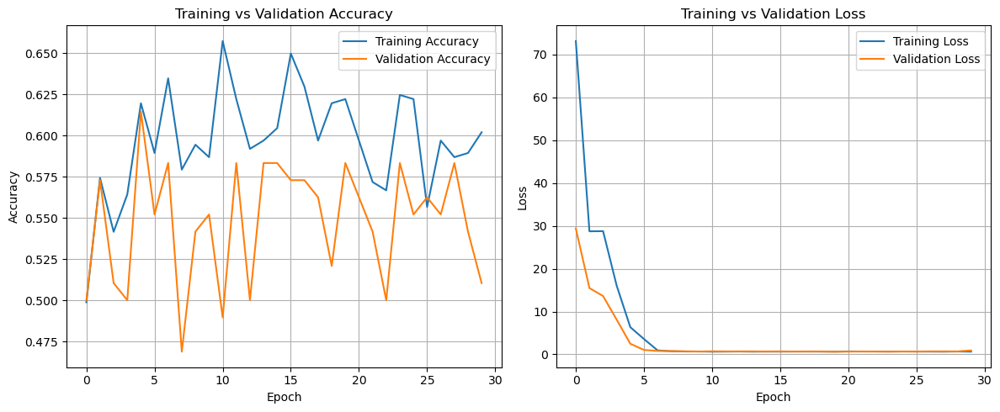


Starting evaluation...
Evaluation Complete. Test Accuracy: 0.5467


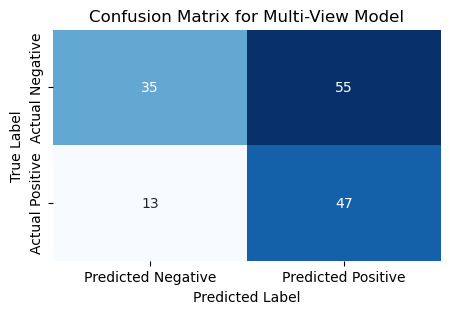

             CC SingleView Test  MLO SingleView Test  Multi-View Model
Accuracy               0.526667             0.586667          0.546667
Precision              0.438202             0.484375          0.460784
Recall                 0.650000             0.516667          0.783333
Specificity            0.655738             0.662791          0.729167
F1-Score               0.523490             0.500000          0.580247
TP                    39.000000            31.000000         47.000000
FP                    50.000000            33.000000         55.000000
TN                    40.000000            57.000000         35.000000
FN                    21.000000            29.000000         13.000000


In [ ]:
# Create our multi view dataset
print("Multi-View Model")
train_dataset = MultiViewDataset([single_view_cc.torch_dataset_train_view, single_view_mlo.torch_dataset_train_view] )
val_dataset = MultiViewDataset([single_view_cc.torch_dataset_validation_view, single_view_mlo.torch_dataset_validation_view] )
test_dataset = MultiViewDataset([single_view_cc.torch_dataset_test_view, single_view_mlo.torch_dataset_test_view] )

# Create DataLoaders
# Change batch size to Batch/num of views
train_loader = DataLoader(train_dataset, batch_size=int(CONFIG['batch_size']/2), shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=int(CONFIG['batch_size']/2),  shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=int(CONFIG['batch_size']/2),  shuffle=False)
print(f"Training samples: {len(train_dataset)}.  Validation samples: {len(val_dataset)}. Testing samples: {len(test_dataset)}.")

# Initialize the Late Fusion Fully Connected (LFFC) model
model = LateFusionFC(  num_classes=CONFIG['num_classes'],   num_views=CONFIG['num_views'],  feature_extractor_requires_grad=False # Set to False as we do not fine-tune ResNet weights 
).to(CONFIG['device']) 

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=CONFIG['learning_rate'])
# Start training and evaluation of Multi View model 
mv_model, mv_best_model_state, mv_best_model_test_predictions, mv_all_test_labels = train_model(model, train_loader, val_loader,
test_loader, criterion, optimizer, CONFIG['device'], CONFIG['mv_num_epochs'], CONFIG['patience'])

# Evaluate the model
test_accuracy, multi_performance_results = evaluate_model(model, test_loader, CONFIG['device'])
compare_performance_all_views(cc_performance_results, mlo_performance_results, multi_performance_results)

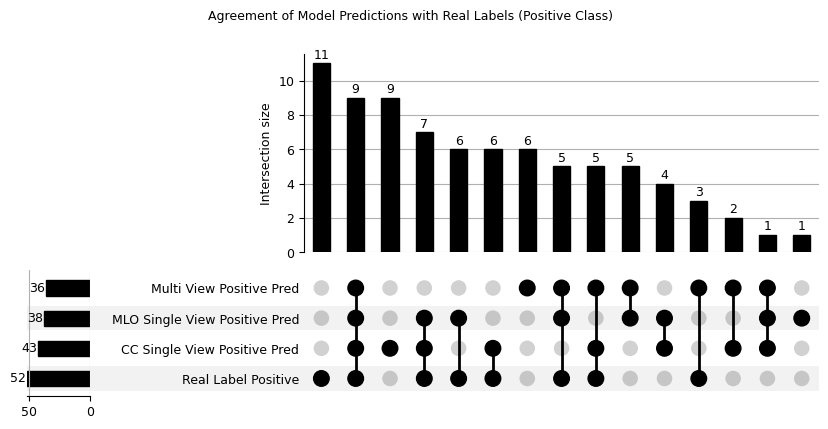

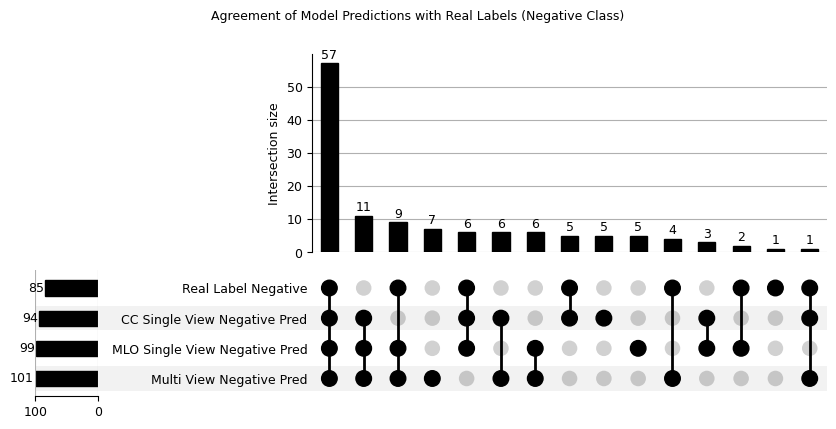

In [ ]:
# Look at the classifications of all the models to see how they align with each other using Upset Plots
all_test_predictions = {
    'ground_truth': mv_all_test_labels ,
    'single_view_cc' : single_view_cc_best_model_test_predictions,
    'single_view_mlo' : single_view_mlo_best_model_test_predictions,
    'mv_view': mv_best_model_test_predictions }
df = pd.DataFrame(all_test_predictions)

# Indices for samples where Models and Ground Truth are predicted positive
model1_positive_samples = df[df['single_view_cc'] == 1].index.tolist()
model2_positive_samples = df[df['single_view_mlo'] == 1].index.tolist()
model3_positive_samples = df[df['mv_view'] == 1].index.tolist()
real_positive_samples = df[df['ground_truth'] == 1].index.tolist()

# Indices for samples where Models and Ground Truth are predicted negative
model1_negative_samples = df[df['single_view_cc'] == 0].index.tolist()
model2_negative_samples = df[df['single_view_mlo'] == 0].index.tolist()
model3_negative_samples = df[df['mv_view'] == 0].index.tolist()
real_negative_samples = df[df['ground_truth'] == 0].index.tolist()
pos_sets_data = from_contents({
    'Real Label Positive': real_positive_samples,
    'CC Single View Positive Pred': model1_positive_samples,
    'MLO Single View Positive Pred': model2_positive_samples,
    'Multi View Positive Pred': model3_positive_samples
})
neg_sets_data = from_contents({
    'Real Label Negative': real_negative_samples,
    'CC Single View Negative Pred': model1_negative_samples,
    'MLO Single View Negative Pred': model2_negative_samples,
    'Multi View Negative Pred': model3_negative_samples
})

# Plot the UpSet plot for the Positive classifications
plt.rcParams['font.size'] = 9
plot(pos_sets_data, show_counts=True, sort_by='cardinality', orientation='horizontal')
plt.suptitle('Agreement of Model Predictions with Real Labels (Positive Class)', fontsize=9)
plt.show()
# Plot the UpSet plot for the Negative classifications
plot(neg_sets_data, show_counts=True, sort_by='cardinality', orientation='horizontal')
plt.suptitle('Agreement of Model Predictions with Real Labels (Negative Class)', fontsize=9)
plt.show()

In [ ]:
# Try Score Fusion

@torch.no_grad()
def score_fusion_predict(models, dataloaders, fusion_type='sum', device='cpu'):
    """
    Performs score fusion from multiple trained single-view CNN models.
    
    Args:
        models (list[torch.nn.Module]): List of trained models (1 per view)
        dataloaders (list[torch.utils.data.DataLoader]): List of test dataloaders (1 per view)
        fusion_type (str): One of 'sum', 'product', or 'max'
        device (str): 'cuda' or 'cpu'

    Returns:
        fused_predictions: List of predicted class indices
        all_labels: List of ground truth labels (assumed same across views)
    """
    assert fusion_type in ['sum', 'product', 'max']
    assert len(models) == len(dataloaders)

    num_views = len(models)
    all_softmax_scores = []
    all_labels = []

    for model, loader in zip(models, dataloaders):
        model.eval()
        model.to(device)

        view_scores = []
        view_labels = []

        for inputs, labels in loader:
            inputs = inputs.to(device)
            outputs = model(inputs)
            probs = F.softmax(outputs, dim=1)  # Shape: (batch_size, num_classes)

            view_scores.append(probs.cpu())
            if len(all_labels) == 0:
                view_labels.extend(labels.cpu().numpy())

        all_softmax_scores.append(torch.cat(view_scores, dim=0))

    # Stack softmax scores from all views: (num_views, num_samples, num_classes)
    scores_tensor = torch.stack(all_softmax_scores, dim=0)

    # Perform score fusion
    if fusion_type == 'sum':
        fused_scores = torch.sum(scores_tensor, dim=0)
    elif fusion_type == 'product':
        fused_scores = torch.prod(scores_tensor, dim=0)
    elif fusion_type == 'max':
        fused_scores, _ = torch.max(scores_tensor, dim=0)

    # Final predictions from fused scores
    fused_predictions = torch.argmax(fused_scores, dim=1).numpy()
    return fused_predictions, np.array(view_labels)

# Load each saved Single View model and test dataset
view_names = ['CC', 'MLO'] 
loaded_models = []


cc_test_dataloader = DataLoader(single_view_cc.torch_dataset_test_view, batch_size=CONFIG['batch_size'], shuffle=False) # No shuffle for test
mlo_test_dataloader = DataLoader(single_view_mlo.torch_dataset_test_view, batch_size=CONFIG['batch_size'], shuffle=False) # No shuffle for test
from torchvision import models 
test_loaders_dict = {"CC": cc_test_dataloader, "MLO": mlo_test_dataloader}
test_loaders = []

for view in view_names:
    model = models.resnet50(weights=None)
    model.fc = torch.nn.Linear(2048, 2)
    model.load_state_dict(torch.load(f"./model_{view}_best_val_model.pth")) 
    model.to(device=CONFIG['device'])
    model.eval()
    loaded_models.append(model)

    test_loader =test_loaders_dict[view]
    test_loaders.append(test_loader)

# Run fusion
preds_sum, labels = score_fusion_predict(loaded_models, test_loaders, fusion_type='sum', device=CONFIG['device'])
preds_prod, _ = score_fusion_predict(loaded_models, test_loaders, fusion_type='product', device=CONFIG['device'])
preds_max, _ = score_fusion_predict(loaded_models, test_loaders, fusion_type='max', device=CONFIG['device'])

# Evaluate
from sklearn.metrics import classification_report
print("Sum Fusion:\n", classification_report(labels, preds_sum))
print("Product Fusion:\n", classification_report(labels, preds_prod))
print("Max Fusion:\n", classification_report(labels, preds_max))

Sum Fusion:
               precision    recall  f1-score   support

           0       0.73      0.85      0.79        85
           1       0.67      0.50      0.57        52

    accuracy                           0.72       137
   macro avg       0.70      0.67      0.68       137
weighted avg       0.71      0.72      0.71       137

Product Fusion:
               precision    recall  f1-score   support

           0       0.73      0.85      0.79        85
           1       0.67      0.50      0.57        52

    accuracy                           0.72       137
   macro avg       0.70      0.67      0.68       137
weighted avg       0.71      0.72      0.71       137

Max Fusion:
               precision    recall  f1-score   support

           0       0.73      0.85      0.79        85
           1       0.67      0.50      0.57        52

    accuracy                           0.72       137
   macro avg       0.70      0.67      0.68       137
weighted avg       0.71      0.

Score fusion showing no real improvement indicates the two views (CC and MLO) are highly redundant (i.e., they provide very similar information and make similar errors), so simply combining their scores is not adding much value. These fusion methods would have been better if the individual models were complementary. 

In [ ]:
#  Extract predictions from existing dictionary 
true_labels = np.array(all_test_predictions['ground_truth'])
cc_preds = np.array(all_test_predictions['single_view_cc'])
mlo_preds = np.array(all_test_predictions['single_view_mlo'])

#  Individual View Performance 
print("\n--- Individual View Performance ---")
# Ensure the lengths match, otherwise comparisons will fail or be meaningless
if len(true_labels) != len(cc_preds) or len(true_labels) != len(mlo_preds):
    print("WARNING: Lengths of true_labels and predictions do not match!")
    print(f"True labels length: {len(true_labels)}")
    print(f"CC predictions length: {len(cc_preds)}")
    print(f"MLO predictions length: {len(mlo_preds)}")

print(f"CC Accuracy: {np.mean(cc_preds == true_labels):.4f}")
print(f"MLO Accuracy: {np.mean(mlo_preds == true_labels):.4f}")

# ---  Identify Misclassified Samples for each view ---
cc_misclassified_indices = np.where(cc_preds != true_labels)[0]
mlo_misclassified_indices = np.where(mlo_preds != true_labels)[0]

print(f"\nNumber of misclassified samples by CC: {len(cc_misclassified_indices)}")
print(f"Number of misclassified samples by MLO: {len(mlo_misclassified_indices)}")

# ---  Compare and find overlap ---
cc_misclassified_set = set(cc_misclassified_indices)
mlo_misclassified_set = set(mlo_misclassified_indices)

# Samples misclassified by BOTH views
overlap_misclassified_indices = cc_misclassified_set.intersection(mlo_misclassified_set)
num_overlap_misclassified = len(overlap_misclassified_indices)

# Samples misclassified by CC but NOT MLO (complementary errors for MLO)
cc_only_misclassified = cc_misclassified_set.difference(mlo_misclassified_set)
num_cc_only = len(cc_only_misclassified)

# Samples misclassified by MLO but NOT CC (complementary errors for CC)
mlo_only_misclassified = mlo_misclassified_set.difference(cc_misclassified_set)
num_mlo_only = len(mlo_only_misclassified)

print("\n--- Misclassification Overlap Analysis ---")
print(f"Samples misclassified by BOTH CC and MLO: {num_overlap_misclassified}")
print(f"Samples misclassified by ONLY CC: {num_cc_only}")
print(f"Samples misclassified by ONLY MLO: {num_mlo_only}")

# Total unique misclassified samples (for sanity check: should be sum of the three above)
total_unique_misclassified = len(cc_misclassified_set.union(mlo_misclassified_set))
print(f"Total unique samples misclassified by at least one view: {total_unique_misclassified}")

# --- Interpretation Hints ---
print("\n--- Interpretation ---")
if len(cc_misclassified_indices) > 0 and len(mlo_misclassified_indices) > 0: # Avoid division by zero if no errors
    if num_overlap_misclassified / min(len(cc_misclassified_indices), len(mlo_misclassified_indices)) > 0.5:
        print("High overlap in misclassified samples. This suggests the views are making similar errors.")
        print("Simple score fusion might not yield large gains because the models are redundant in their mistakes.")
        print("Consider: Feature-level fusion, more complex learnable fusion, or improving individual models first.")
    elif num_cc_only > 0 and num_mlo_only > 0:
        print("Significant number of samples misclassified by only one view.")
        print("This indicates complementarity, which is good! Score fusion (especially max or weighted sum) should ideally benefit from this.")
        print("If fusion didn't improve much, consider weighted fusion or a learnable fusion layer.")
    else:
        print("The error patterns are not clearly highly overlapping or highly complementary.")
        print("Further investigation into specific sample errors might be needed.")
else:
    print("One or both models have no misclassified samples, or an issue occurred preventing proper calculation.")


# Example: Display a few indices from each category
if num_overlap_misclassified > 0:
    print(f"\nExample indices misclassified by BOTH: {list(overlap_misclassified_indices)[:5]}")
if num_cc_only > 0:
    print(f"Example indices misclassified by ONLY CC: {list(cc_only_misclassified)[:5]}")
if num_mlo_only > 0:
    print(f"Example indices misclassified by ONLY MLO: {list(mlo_only_misclassified)[:5]}")



Type of true_labels: <class 'numpy.ndarray'>, Shape: (137,)
First 10 true_labels: [0 1 0 1 1 0 1 1 0 1]
Type of cc_preds: <class 'numpy.ndarray'>, Shape: (137,)
First 10 cc_preds: [0 1 0 0 1 0 0 0 1 1]
Type of mlo_preds: <class 'numpy.ndarray'>, Shape: (137,)
First 10 mlo_preds: [0 1 0 1 1 0 0 1 0 1]

--- Individual View Performance ---
CC Accuracy: 0.7007
MLO Accuracy: 0.7372

Number of misclassified samples by CC: 41
Number of misclassified samples by MLO: 36

--- Misclassification Overlap Analysis ---
Samples misclassified by BOTH CC and MLO: 19
Samples misclassified by ONLY CC: 22
Samples misclassified by ONLY MLO: 17
Total unique samples misclassified by at least one view: 58

--- Interpretation ---
High overlap in misclassified samples. This suggests the views are making similar errors.
Simple score fusion might not yield large gains because the models are redundant in their mistakes.
Consider: Feature-level fusion, more complex learnable fusion, or improving individual models fi

There is significant complementarity :
22 samples that CC misclassifies, but MLO classifies correctly.
17 samples that MLO misclassifies, but CC classifies correctly.

39 samples represent cases where one model is wrong, but the other has the right answer. This is the kind of scenario where a well-implemented fusion strategy could be able to leverage the strengths of each view and improve overall accuracy.

Why did score fusion not give better results:
Sum Fusion: It might be averaging out the strong predictions from the correct model with the weak/incorrect predictions from the wrong model.
Product Fusion: This is sensitive. If one model is strongly confident but wrong (e.g., outputs 0.9 for the wrong class), and the other model has a low but correct probability (e.g., 0.1 for the correct class), their product might still lead to the wrong class winning, or make the probabilities too small to be meaningful.
Max Fusion: This picks the highest probability. If the wrong model happens to have a higher confidence (softmax score) even when incorrect, max fusion will pick that incorrect answer. 